# Image Sharpening Using Laplacian and High-Boost Filtering

## Group Members
| # | Name                           | Student ID |
|---|--------------------------------|------------|
| 1 | Kofi Sarpei Lartey              | 11333137   |
| 2 | Theo Daniels                    | 11031981   |
| 3 | Nana Yentumey                   | 11339613   |
| 4 | Abdul Jabbar Eassiah Mahdi      | 11063705   |
| 5 | Prince Nana Kwesi Arthur        | 11078728   |
| 6 | Muiz Ajeola Bello               | 11068463   |
| 7 | Denis Bagresolzu Bayor          | 11252482   |
| 8 | Eshun Nhyira Abeeku              | 11013338   |


# Image Sharpening Using Laplacian and High-Boost Filtering

## Overview

This project investigates classical spatial-domain image sharpening techniques using **Laplacian sharpening** and **High-Boost filtering**. The objective is to evaluate how effectively each method enhances image quality and restores edge information in degraded images.

The evaluation employs two complementary approaches:

1. **Real-world Evaluation**: Sharp and blurry images from separate datasets are analyzed. Sharp images establish baseline sharpness ranges using Variance of Laplacian metrics, while sharpening techniques are applied exclusively to blurry images to assess their restoration capabilities.

2. **Controlled Augmentation**: Sharp images serve as ground truth references and are intentionally degraded using Gaussian blur to simulate defocus. Sharpening algorithms are then applied to these degraded images, and restoration performance is quantitatively evaluated against the original sharp images using multiple image quality metrics.

The goal is to determine which sharpening method more effectively recovers structural and edge information while preserving overall image fidelity across different degradation scenarios.

---

## Approach

### **Approach 1: Real-World Sharp vs Blurry Images**

This approach evaluates sharpening methods on naturally occurring blurry images:

1. **Baseline Establishment**  
   Sharp images are scored using Variance of Laplacian to establish reference sharpness ranges. No filtering is applied to these images—they serve purely as quality benchmarks.

2. **Blurry Image Restoration**  
   Sharpening techniques are applied exclusively to blurry images:
   - **Laplacian Sharpening**: Uses the second-order derivative (Laplacian operator) to detect and subtract edge information, enhancing high-frequency components.
   - **High-Boost Filtering**: Amplifies the original image while subtracting a Gaussian-smoothed version, with the boost factor (A=1.5) controlling enhancement strength.

3. **Performance Measurement**  
   Each method is evaluated using **Variance of Laplacian** as the sharpness metric. Improvement is measured by comparing the sharpness scores of filtered images against their original blurry state.

### **Approach 2: Controlled Augmentation Experiment**

This approach uses a controlled experimental framework for objective evaluation:

1. **Ground Truth Selection**  
   A dataset of sharp images serves as the reference standard for all comparisons.

2. **Controlled Degradation**  
   Gaussian blur (kernel size = 9×9) is applied to each sharp image to simulate defocus blur, creating a known degradation baseline.

3. **Sharpening Application**  
   Both restoration methods are applied to the blurred images:
   - **Laplacian Sharpening**: Enhances edges through Laplacian edge detection and subtraction
   - **High-Boost Filtering**: Enhances details by amplifying the difference between the original and its smoothed version

4. **Quantitative Evaluation**  
   Each restored image is compared to the original ground truth using multiple metrics:
   - **MSE (Mean Squared Error)** — measures pixel-wise reconstruction error (lower is better)
   - **PSNR (Peak Signal-to-Noise Ratio)** — quantifies reconstruction quality in dB (higher is better)
   - **SSIM (Structural Similarity Index)** — assesses perceptual structural fidelity on a scale of -1 to 1 (higher is better)
   - **Variance of Laplacian** — measures edge energy and sharpness

5. **Performance Comparison**  
   Improvement is measured relative to the blurred baseline. The method with higher average PSNR gain and SSIM values is considered more effective at restoring image quality.

### **Evaluation Strategy**

Both approaches provide complementary insights:
- **Approach 1** tests real-world applicability on naturally degraded images
- **Approach 2** provides controlled, reproducible measurements against known ground truth

This dual-methodology ensures that sharpening performance is assessed both objectively through quantitative metrics and practically through real-world image restoration scenarios, rather than relying solely on visual inspection.

## Setup and Imports

In [2]:
import cv2
import os
import numpy as np
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim

## Configuration

In [3]:
# Set your folders here
SHARP_FOLDER = "C:\\Users\\user\\Desktop\\DEV_FILES\\407\\sharp"
BLURRY_FOLDER = "C:\\Users\\user\\Desktop\\DEV_FILES\\407\\blurry"

# High-boost parameter
HIGH_BOOST_A = 1.5

## Utility Functions

### Sharpness Metric (Variance of Laplacian)

In [4]:
def blur_score(image):
    """Calculate sharpness score using variance of Laplacian. Higher = sharper."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    lap = cv2.Laplacian(gray, cv2.CV_64F)
    return lap.var()

### Sharpening Methods

In [5]:
def high_boost_filter(image, A=1.5):
    """Apply high-boost filtering to enhance edges."""
    blur = cv2.GaussianBlur(image, (5, 5), 0)
    return cv2.addWeighted(image, A, blur, -1, 0)


def laplacian_sharpen(image):
    """Apply Laplacian-based sharpening."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    lap = cv2.Laplacian(gray, cv2.CV_64F)
    lap = np.uint8(np.absolute(lap))
    sharpened = cv2.subtract(gray, lap)
    return cv2.cvtColor(sharpened, cv2.COLOR_GRAY2BGR)

---
# Approach 1: Real-world Sharp vs Blurry Images

## Step 1: Score Sharp Images (Baseline Only)

In [6]:
def score_sharp_images(folder_path, visualize=False, max_visualize=5):
    """Score sharp images to establish baseline sharpness ranges. No filtering applied."""
    results = []
    visualize_count = 0

    for filename in tqdm(os.listdir(folder_path), desc="Scoring sharp images"):
        path = os.path.join(folder_path, filename)
        image = cv2.imread(path)

        if image is None:
            continue

        original_score = blur_score(image)

        results.append({
            "filename": filename,
            "category": "sharp",
            "sharpness_score": original_score
        })

        # Visualization: Show only the sharp image with its score
        if visualize and visualize_count < max_visualize:
            image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

            plt.figure(figsize=(6, 5))
            plt.imshow(image_rgb)
            plt.title(f"Sharp Image\nSharpness Score: {original_score:.2f}")
            plt.axis("off")
            plt.suptitle(f"BASELINE - {filename}")
            plt.tight_layout()
            plt.show()

            visualize_count += 1

    return pd.DataFrame(results)

Scoring sharp images:   0%|          | 0/5 [00:00<?, ?it/s]

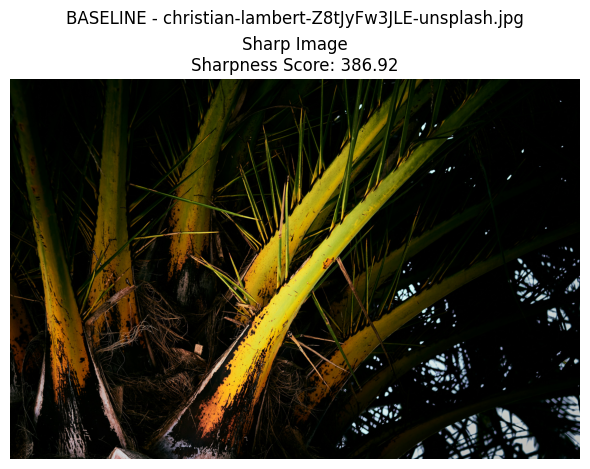

Scoring sharp images:  20%|██        | 1/5 [00:02<00:11,  2.95s/it]

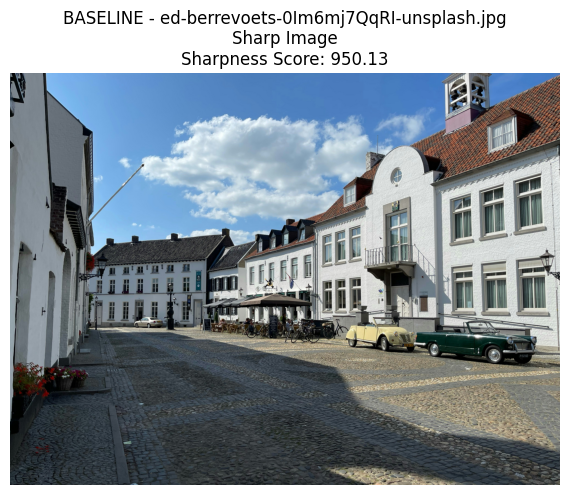

Scoring sharp images:  40%|████      | 2/5 [00:05<00:08,  2.85s/it]

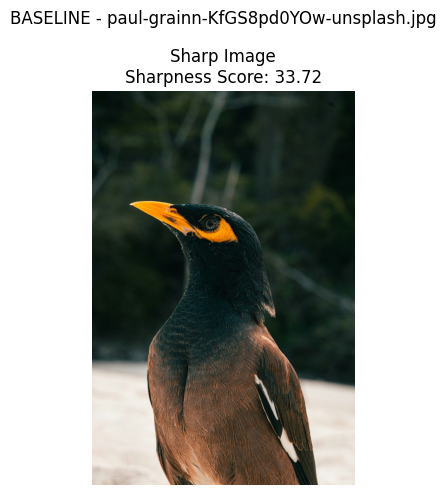

Scoring sharp images:  60%|██████    | 3/5 [00:10<00:07,  3.57s/it]

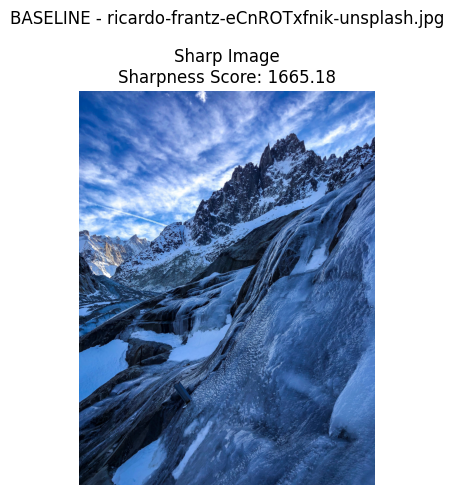

Scoring sharp images:  80%|████████  | 4/5 [00:12<00:03,  3.15s/it]

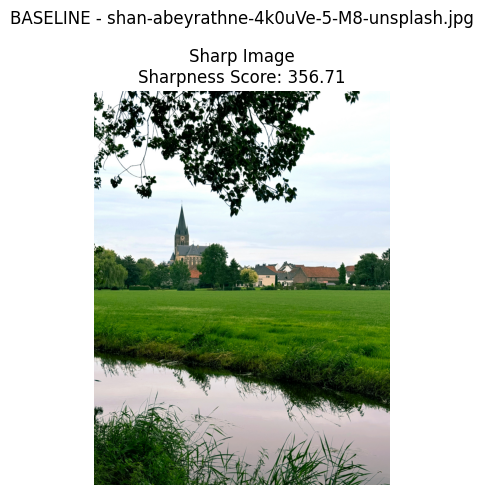

Scoring sharp images: 100%|██████████| 5/5 [00:15<00:00,  3.03s/it]



Sharp images baseline statistics:
count       5.000000
mean      678.532435
std       642.580311
min        33.719060
25%       356.709022
50%       386.917805
75%       950.134851
max      1665.181440
Name: sharpness_score, dtype: float64


,filename,category,sharpness_score
0,christian-lambert-Z8tJyFw3JLE-unsplash.jpg,sharp,386.917805
1,ed-berrevoets-0Im6mj7QqRI-unsplash.jpg,sharp,950.134851
2,paul-grainn-KfGS8pd0YOw-unsplash.jpg,sharp,33.719060
3,ricardo-frantz-eCnROTxfnik-unsplash.jpg,sharp,1665.181440
4,shan-abeyrathne-4k0uVe-5-M8-unsplash.jpg,sharp,356.709022


In [7]:
# Score sharp images (baseline reference)
sharp_df = score_sharp_images(SHARP_FOLDER, visualize=True, max_visualize=5)
print(f"\nSharp images baseline statistics:")
print(sharp_df['sharpness_score'].describe())
sharp_df.head()

## Step 2: Process Blurry Images with Filtering Techniques

In [8]:
def process_blurry_images(folder_path, visualize=False, max_visualize=5):
    """Apply sharpening techniques to blurry images and compare results."""
    results = []
    visualize_count = 0

    for filename in tqdm(os.listdir(folder_path), desc="Processing blurry images"):
        path = os.path.join(folder_path, filename)
        image = cv2.imread(path)

        if image is None:
            continue

        # Score original blurry image
        original_score = blur_score(image)

        # Apply sharpening techniques
        hb_image = high_boost_filter(image, HIGH_BOOST_A)
        hb_score = blur_score(hb_image)

        lap_image = laplacian_sharpen(image)
        lap_score = blur_score(lap_image)

        results.append({
            "filename": filename,
            "category": "blurry",
            "original_score": original_score,
            "highboost_score": hb_score,
            "laplacian_score": lap_score,
            "highboost_gain": hb_score - original_score,
            "laplacian_gain": lap_score - original_score
        })

        # Visualization: Show blurry -> filtered progression
        if visualize and visualize_count < max_visualize:
            image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            hb_rgb = cv2.cvtColor(hb_image, cv2.COLOR_BGR2RGB)
            lap_rgb = cv2.cvtColor(lap_image, cv2.COLOR_BGR2RGB)

            fig, ax = plt.subplots(1, 3, figsize=(18, 5))

            ax[0].imshow(image_rgb)
            ax[0].set_title(f"Original Blurry\nScore: {original_score:.2f}")
            ax[0].axis("off")

            ax[1].imshow(lap_rgb)
            ax[1].set_title(f"Laplacian Filtered\nScore: {lap_score:.2f}\nGain: +{lap_score - original_score:.2f}")
            ax[1].axis("off")

            ax[2].imshow(hb_rgb)
            ax[2].set_title(f"High-Boost Filtered\nScore: {hb_score:.2f}\nGain: +{hb_score - original_score:.2f}")
            ax[2].axis("off")

            plt.suptitle(f"BLURRY IMAGE RESTORATION - {filename}")
            plt.tight_layout()
            plt.show()

            visualize_count += 1

    return pd.DataFrame(results)

Processing blurry images:   0%|          | 0/5 [00:00<?, ?it/s]

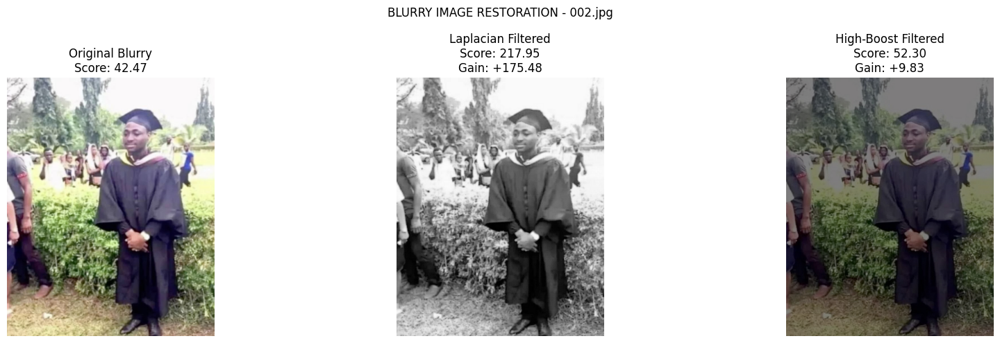

Processing blurry images:  20%|██        | 1/5 [00:01<00:04,  1.02s/it]

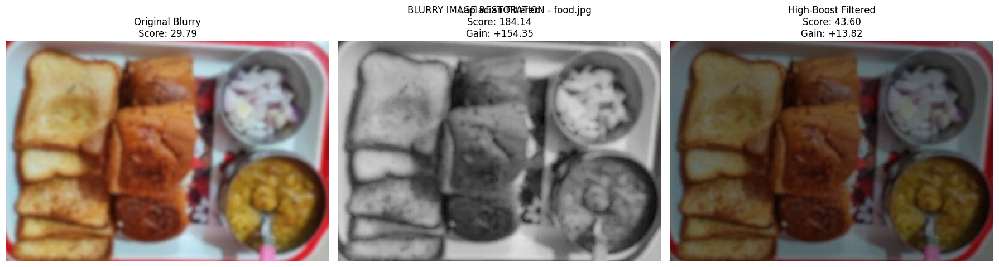

Processing blurry images:  40%|████      | 2/5 [00:02<00:03,  1.15s/it]

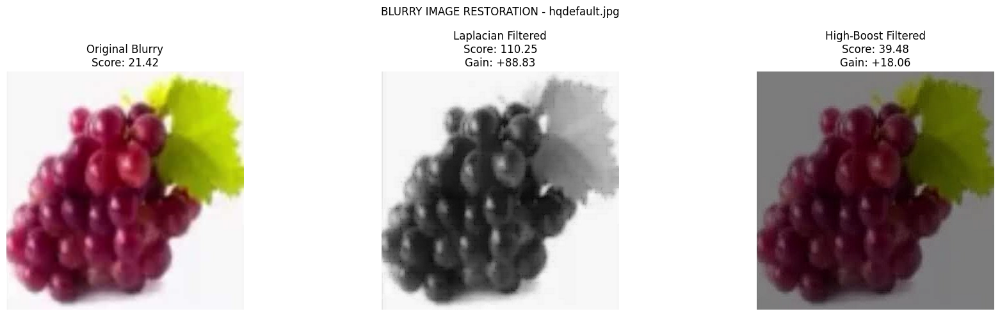

Processing blurry images:  60%|██████    | 3/5 [00:03<00:02,  1.23s/it]

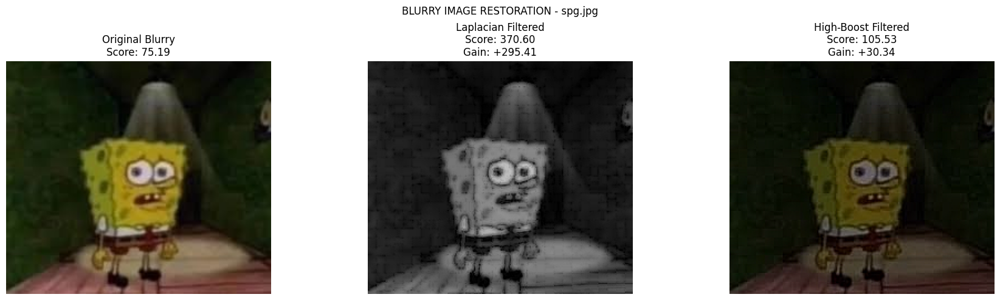

Processing blurry images:  80%|████████  | 4/5 [00:04<00:01,  1.14s/it]

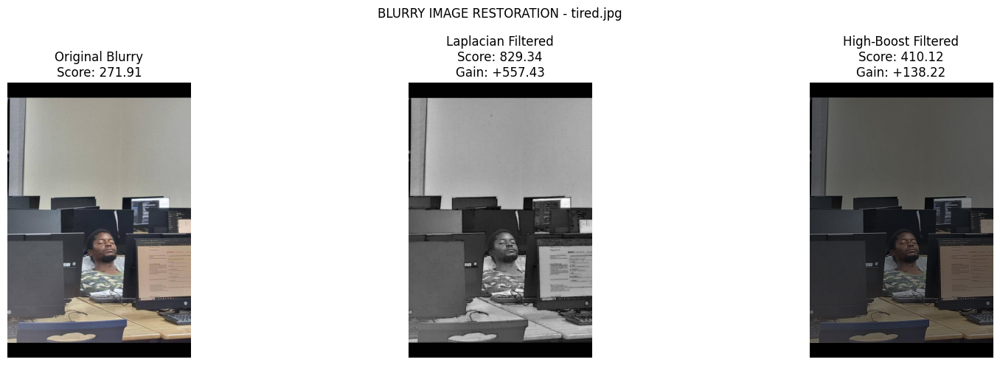

Processing blurry images: 100%|██████████| 5/5 [00:05<00:00,  1.17s/it]


,filename,category,original_score,highboost_score,laplacian_score,highboost_gain,laplacian_gain
0,002.jpg,blurry,42.469983,52.304914,217.950748,9.834932,175.480765
1,food.jpg,blurry,29.785861,43.601723,184.136752,13.815863,154.350892
2,hqdefault.jpg,blurry,21.421055,39.479740,110.250499,18.058685,88.829444
3,spg.jpg,blurry,75.193072,105.531189,370.604037,30.338116,295.410964
4,tired.jpg,blurry,271.905322,410.123823,829.338563,138.218500,557.433241


In [9]:
# Process blurry images with filtering techniques
blurry_df = process_blurry_images(BLURRY_FOLDER, visualize=True, max_visualize=5)
blurry_df.head()

## Step 3: Summary and Comparison

In [10]:
# Combine results for overview
print("\n" + "="*60)
print("BASELINE: Sharp Image Sharpness Range")
print("="*60)
print(f"Mean sharpness: {sharp_df['sharpness_score'].mean():.2f}")
print(f"Std deviation: {sharp_df['sharpness_score'].std():.2f}")
print(f"Min: {sharp_df['sharpness_score'].min():.2f}")
print(f"Max: {sharp_df['sharpness_score'].max():.2f}")

print("\n" + "="*60)
print("BLURRY IMAGES: Filtering Results")
print("="*60)

blurry_summary = blurry_df[[
    "original_score",
    "highboost_score",
    "laplacian_score",
    "highboost_gain",
    "laplacian_gain"
]].mean()

print(blurry_summary)

# Determine best method for blurry images
print("\n" + "="*60)
if blurry_summary["highboost_gain"] > blurry_summary["laplacian_gain"]:
    print("Best method for blurry images: High-Boost Filter")
    print(f"Average improvement: +{blurry_summary['highboost_gain']:.2f}")
else:
    print("Best method for blurry images: Laplacian Sharpening")
    print(f"Average improvement: +{blurry_summary['laplacian_gain']:.2f}")
print("="*60)


BASELINE: Sharp Image Sharpness Range
Mean sharpness: 678.53
Std deviation: 642.58
Min: 33.72
Max: 1665.18

BLURRY IMAGES: Filtering Results
original_score      88.155059
highboost_score    130.208278
laplacian_score    342.456120
highboost_gain      42.053219
laplacian_gain     254.301061
dtype: float64

Best method for blurry images: Laplacian Sharpening
Average improvement: +254.30


---
# Approach 2: Controlled Augmentation Experiment

## Configuration for Augmentation

In [11]:
# Augmentation parameters
BLUR_KERNEL = 9               # Gaussian blur kernel size (must be odd)
VISUALIZE_AUG = True          # Show samples during processing
MAX_VISUALIZE_AUG = 5         # Limit visualizations

## Degradation Function

In [12]:
def add_blur(image, ksize=9):
    """Apply controlled Gaussian blur degradation."""
    return cv2.GaussianBlur(image, (ksize, ksize), 0)

## Additional Evaluation Metrics

In [13]:
def mse(img1, img2):
    """Calculate Mean Squared Error between two images."""
    return np.mean((img1.astype("float") - img2.astype("float")) ** 2)


def psnr(img1, img2):
    """Calculate Peak Signal-to-Noise Ratio. Higher = better quality."""
    mse_val = mse(img1, img2)
    if mse_val == 0:
        return float("inf")
    return 20 * np.log10(255.0 / np.sqrt(mse_val))


def compute_ssim(img1, img2):
    """Calculate Structural Similarity Index. Range [-1, 1], higher = better."""
    gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
    return ssim(gray1, gray2)

## Processing Pipeline with Ground Truth Comparison

In [14]:
def process_augmented_dataset(folder_path):
    """
    Process sharp images with controlled degradation and restoration.
    Compares all versions against original ground truth.
    """
    results = []
    visualize_count = 0

    for filename in tqdm(os.listdir(folder_path), desc="Processing augmented images"):
        path = os.path.join(folder_path, filename)
        original = cv2.imread(path)

        if original is None:
            continue

        # Ground truth score
        original_sharpness = blur_score(original)

        # Apply controlled degradation
        blurred = add_blur(original, BLUR_KERNEL)

        # Apply restoration techniques
        hb = high_boost_filter(blurred, HIGH_BOOST_A)
        lap = laplacian_sharpen(blurred)

        # Calculate metrics against ground truth
        blurred_psnr = psnr(original, blurred)
        hb_psnr = psnr(original, hb)
        lap_psnr = psnr(original, lap)

        blurred_ssim = compute_ssim(original, blurred)
        hb_ssim = compute_ssim(original, hb)
        lap_ssim = compute_ssim(original, lap)

        blurred_mse = mse(original, blurred)
        hb_mse = mse(original, hb)
        lap_mse = mse(original, lap)

        results.append({
            "filename": filename,
            "original_sharpness": original_sharpness,
            "blurred_psnr": blurred_psnr,
            "highboost_psnr": hb_psnr,
            "laplacian_psnr": lap_psnr,
            "blurred_ssim": blurred_ssim,
            "highboost_ssim": hb_ssim,
            "laplacian_ssim": lap_ssim,
            "blurred_mse": blurred_mse,
            "highboost_mse": hb_mse,
            "laplacian_mse": lap_mse,
            "highboost_psnr_gain": hb_psnr - blurred_psnr,
            "laplacian_psnr_gain": lap_psnr - blurred_psnr
        })

        # Visualization: Show ground truth and all versions
        if VISUALIZE_AUG and visualize_count < MAX_VISUALIZE_AUG:
            original_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
            blurred_rgb = cv2.cvtColor(blurred, cv2.COLOR_BGR2RGB)
            hb_rgb = cv2.cvtColor(hb, cv2.COLOR_BGR2RGB)
            lap_rgb = cv2.cvtColor(lap, cv2.COLOR_BGR2RGB)

            fig, ax = plt.subplots(1, 4, figsize=(20, 5))

            ax[0].imshow(original_rgb)
            ax[0].set_title(f"Ground Truth\nSharpness: {original_sharpness:.2f}")
            ax[0].axis("off")

            ax[1].imshow(blurred_rgb)
            ax[1].set_title(f"Blurred\nPSNR: {blurred_psnr:.2f}\nSSIM: {blurred_ssim:.3f}")
            ax[1].axis("off")

            ax[2].imshow(hb_rgb)
            ax[2].set_title(f"High-Boost\nPSNR: {hb_psnr:.2f}\nSSIM: {hb_ssim:.3f}")
            ax[2].axis("off")

            ax[3].imshow(lap_rgb)
            ax[3].set_title(f"Laplacian\nPSNR: {lap_psnr:.2f}\nSSIM: {lap_ssim:.3f}")
            ax[3].axis("off")

            plt.suptitle(f"AUGMENTATION EXPERIMENT - {filename}")
            plt.tight_layout()
            plt.show()

            visualize_count += 1

    return pd.DataFrame(results)

## Run Augmentation Pipeline

Processing augmented images:   0%|          | 0/5 [00:00<?, ?it/s]

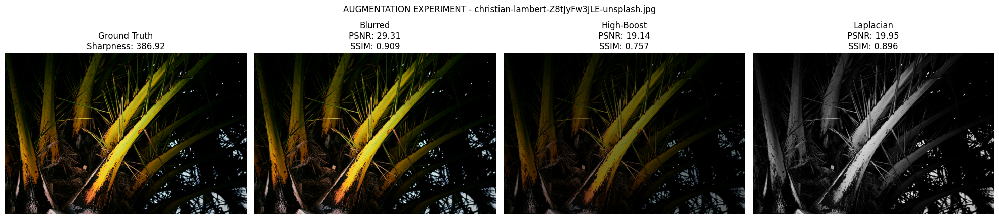

Processing augmented images:  20%|██        | 1/5 [00:28<01:55, 28.92s/it]

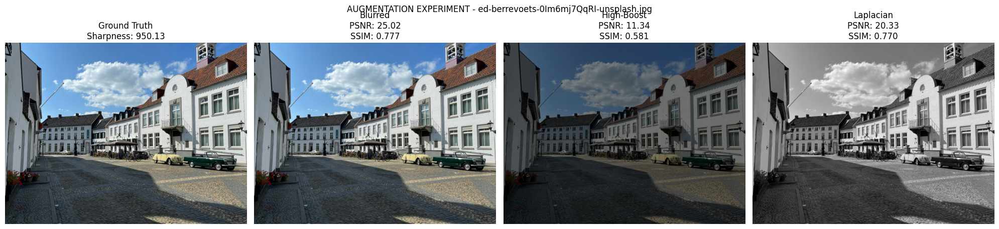

Processing augmented images:  40%|████      | 2/5 [01:05<01:39, 33.22s/it]

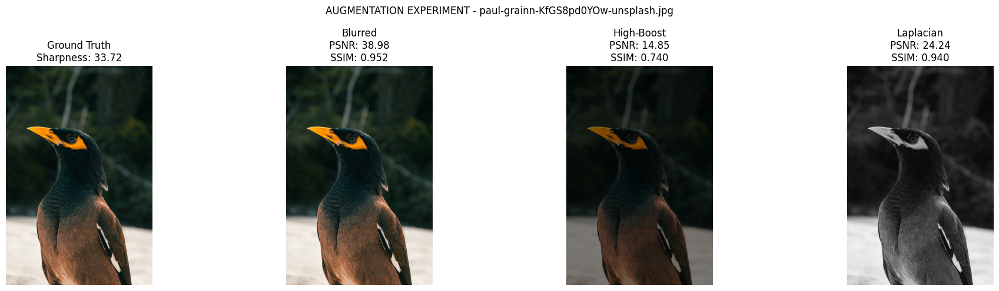

Processing augmented images:  60%|██████    | 3/5 [02:23<01:47, 53.91s/it]

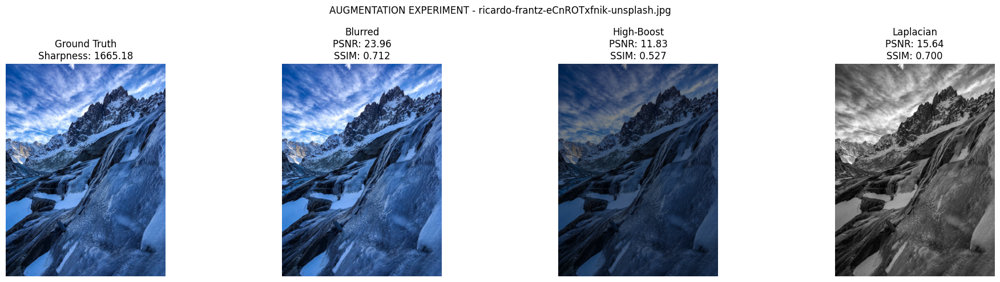

Processing augmented images:  80%|████████  | 4/5 [02:51<00:43, 43.62s/it]

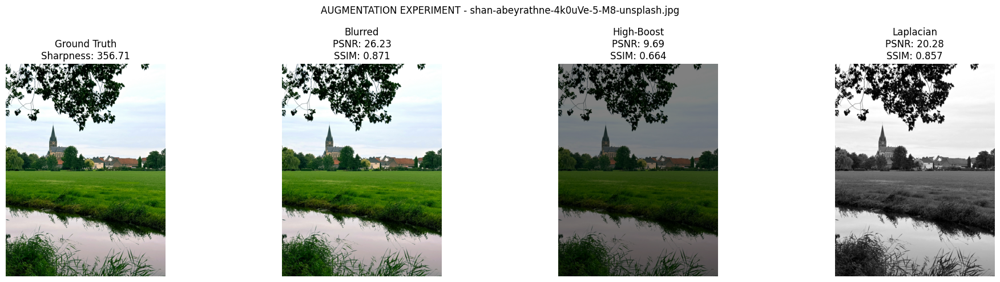

Processing augmented images: 100%|██████████| 5/5 [03:16<00:00, 39.36s/it]


,filename,original_sharpness,blurred_psnr,highboost_psnr,laplacian_psnr,blurred_ssim,highboost_ssim,laplacian_ssim,blurred_mse,highboost_mse,laplacian_mse,highboost_psnr_gain,laplacian_psnr_gain
0,christian-lambert-Z8tJyFw3JLE-unsplash.jpg,386.917805,29.309141,19.144726,19.953705,0.908782,0.757495,0.895596,76.237082,791.785954,657.218651,-10.164415,-9.355436
1,ed-berrevoets-0Im6mj7QqRI-unsplash.jpg,950.134851,25.023436,11.341281,20.325741,0.776506,0.581291,0.769967,204.520469,4774.767702,603.262402,-13.682155,-4.697695
2,paul-grainn-KfGS8pd0YOw-unsplash.jpg,33.719060,38.981679,14.854497,24.237074,0.951539,0.740370,0.940328,8.220769,2126.329995,245.116729,-24.127182,-14.744605
3,ricardo-frantz-eCnROTxfnik-unsplash.jpg,1665.181440,23.960575,11.831294,15.636772,0.711941,0.527367,0.699646,261.229880,4265.313668,1775.837288,-12.129281,-8.323803
4,shan-abeyrathne-4k0uVe-5-M8-unsplash.jpg,356.709022,26.228047,9.687428,20.276742,0.871007,0.663765,0.856840,154.980008,6987.752876,610.107257,-16.540619,-5.951305


In [15]:
aug_df = process_augmented_dataset(SHARP_FOLDER)
aug_df.head()

## Augmentation Results Summary

In [16]:
# Calculate average improvements
aug_summary = aug_df[[
    "highboost_psnr_gain",
    "laplacian_psnr_gain",
    "highboost_ssim",
    "laplacian_ssim",
    "highboost_mse",
    "laplacian_mse"
]].mean()

print("\n" + "="*60)
print("AUGMENTATION EXPERIMENT: Average Restoration Performance")
print("="*60)
print(aug_summary)
print("\n" + "="*60)

# Determine overall best method based on PSNR gain
if aug_summary["highboost_psnr_gain"] > aug_summary["laplacian_psnr_gain"]:
    print("Best overall method: High-Boost Filter")
    print(f"Average PSNR gain: +{aug_summary['highboost_psnr_gain']:.2f} dB")
    print(f"Average SSIM: {aug_summary['highboost_ssim']:.3f}")
else:
    print("Best overall method: Laplacian Sharpening")
    print(f"Average PSNR gain: +{aug_summary['laplacian_psnr_gain']:.2f} dB")
    print(f"Average SSIM: {aug_summary['laplacian_ssim']:.3f}")
print("="*60)


AUGMENTATION EXPERIMENT: Average Restoration Performance
highboost_psnr_gain     -15.328730
laplacian_psnr_gain      -8.614569
highboost_ssim            0.654058
laplacian_ssim            0.832475
highboost_mse          3789.190039
laplacian_mse           778.308465
dtype: float64

Best overall method: Laplacian Sharpening
Average PSNR gain: +-8.61 dB
Average SSIM: 0.832


## Detailed Comparison Table

In [17]:
# Show detailed statistics for both methods
comparison = pd.DataFrame({
    'Metric': ['PSNR (Blurred)', 'PSNR (High-Boost)', 'PSNR (Laplacian)',
               'SSIM (Blurred)', 'SSIM (High-Boost)', 'SSIM (Laplacian)',
               'MSE (Blurred)', 'MSE (High-Boost)', 'MSE (Laplacian)'],
    'Mean': [
        aug_df['blurred_psnr'].mean(),
        aug_df['highboost_psnr'].mean(),
        aug_df['laplacian_psnr'].mean(),
        aug_df['blurred_ssim'].mean(),
        aug_df['highboost_ssim'].mean(),
        aug_df['laplacian_ssim'].mean(),
        aug_df['blurred_mse'].mean(),
        aug_df['highboost_mse'].mean(),
        aug_df['laplacian_mse'].mean()
    ],
    'Std': [
        aug_df['blurred_psnr'].std(),
        aug_df['highboost_psnr'].std(),
        aug_df['laplacian_psnr'].std(),
        aug_df['blurred_ssim'].std(),
        aug_df['highboost_ssim'].std(),
        aug_df['laplacian_ssim'].std(),
        aug_df['blurred_mse'].std(),
        aug_df['highboost_mse'].std(),
        aug_df['laplacian_mse'].std()
    ]
})

print("\nDetailed Metric Comparison:")
print(comparison.to_string(index=False))


Detailed Metric Comparison:
           Metric        Mean         Std
   PSNR (Blurred)   28.700576    6.086333
PSNR (High-Boost)   13.371845    3.728130
 PSNR (Laplacian)   20.086007    3.047064
   SSIM (Blurred)    0.843955    0.098089
SSIM (High-Boost)    0.654058    0.099485
 SSIM (Laplacian)    0.832475    0.097161
    MSE (Blurred)  141.037642  100.635565
 MSE (High-Boost) 3789.190039 2407.197335
  MSE (Laplacian)  778.308465  581.582473
